## You may want to switch to the [Jupyter notebook viewer][1], 
if you are looking at this notebook on Github.
Or few links and photos will be disabled due to some techniqual issues.

[1]: https://nbviewer.jupyter.org/github/chen-szuyu-cody/portfolio/blob/master/Project/wids_datathon_2020/Predicting%20Patients%20Mortality%20Rate%20by%20Using%20Machine%20Learning%20-%20XGBoost.ipynb

# Predict Patients' Survival Rates within the First 24 Hours of ICU Admission

**Authors:** Cody Chen & Sarah Chu

The challenge is to create a model that predicts patients' survival rate in their first 24 hours of intensive care.

# Data Overview

The data was provided by [MIT’s GOSSIS (Global Open Source Severity of Illness Score)][0] initiative.

Essential data includes:
- **training_v2.csv**: Training data with 91,713 encounters and 185 columns

- **unlabeled.csv**: Testing data that is used to predict the survival rate

- **WiDS Datathon 2020 Dictionary.csv**: supplemental information about the data


[0]: https://gossis.mit.edu/

<h1><a id="outline">Project Workflow</a>

1. [Import Essential Packages & Load Datasets](#import_packages_load_datasets)

2. [Exploratory Data Analysis](#eda)

3. [Data Wrangling and Preprocessing](#data_preprocessing)

4. [Modeling](#model)
   1. [Building a Baseline Model](#xgb_model_1)
   2. [Modified XGBoost Model](#xgb_model_2)

5. [Hyperparameter Tuning](#hyperparameter)
 
6. [Cross Validation](#cross_validation)

7. [Final XGBoost Model](#xgb_model_3)

8. [Conclusion](#conclusion)

<h1><a id="import_packages_load_datasets">1. Import Essential Packages & Load Datasets</a></h1>

[Back](#outline)

<h5> Import essential packages

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import sys, os
import time

## supress warnings
import warnings
warnings.filterwarnings('ignore')

import xgboost as xgb
import pickle
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn import metrics
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

import seaborn as sns
from xgboost import plot_tree
from pandas_profiling import ProfileReport
import missingno as msno
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.utils import resample
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
import math
from IPython.utils import io
import copy

pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 92000)
pd.set_option('max_info_columns', 91713)

<h5> Load the Files

In [2]:
def filePath (df, index_col=False):
    """
    
    A function that defines the file path with the right displaying options.
    
    Returns
    -------
    - the path of the file
    
    
    Parameters
    ----------
    df: name of the file

    """

    #Join the path of the current directory with the data set
    filePath = os.path.join(os.getcwd(), df)  
    #Use training.csv's path to read the file
    file = pd.read_csv(filePath, index_col = index_col)
    pd.set_option("display.max_columns",10000)
    pd.set_option("display.max_rows",10000)
    pd.set_option("display.width",10000)
    
    return file

In [3]:
# If your dataset does not in the same folder of your notebook,
# then we can use os.chdir() to change our work direcotry to the path that you assigned to
path_data = 'C:/Users/Cody_Black/JupyterNotebook/Dataset'
os.chdir(path_data)

#Find the file path for the training data set
train = filePath('training_v2.csv')

#Find the file path for the testing data set
test = filePath('unlabeled.csv')

<h1><a id="eda">2. Exploratory Data Analysis</a></h1>
    
[Back](#outline)

The following information is checked:
- **Data Profile**
- **Data Properties**
    1. **High cardinality**
    2. **Imbalanced** property in the target variable
    3. Most patients are between **60 and 89 years old**
    4. Most patients are admitted through **Accident & Emergency, Operating Room/Recovery, and Floor**
    5. Most patients are admitted through **Med-Surg ICU**
    6. Most patients are diagnosed with **Cardiovascular, Neurological, Respiratory, and Sepsis diseases**
    7. 20 out of 183 variables are **strongly related** to the target variable, Hospital Death
    8. 
        1. Over 50% of the variables have over 50% of **missing values**
        
        2. **APACHE II AND APACHE III admission diagnosis** groups and **APACHE II diagnosis for ICU admission** are highly correlated in nullity
    9. Patients who did *not survive* have *higher* **hospital mortality rates**, but there are also many *survived* patients with *high* **hospital mortality rates**
    10. Most of the patients' have **pre icu los days** of *half a day*
    

## Data Profile

[Pandas Profiling][0] is an open source Python module which we can quickly do a basic and quick data analysis.

With **pandas profiling**, two types of rejections are determined:
  - 60 **highly correlated** pairs of variables ( e.g. d1_albumin_min & d1_albumin_max )
  - Variable with only **one** unique value
  
*Note: here we set <code>minimal=True</code> to disable expensive computations (such as correlations and dynamic binning) due to too many categorical variables*

[0]:https://github.com/pandas-profiling/pandas-profiling

In [4]:
## change object columns to type "category" 
data = train
cat = ['encounter_id', 'hospital_id', 'patient_id', 'icu_id', 'hospital_id', 
       'ethnicity', 'gender', 'hospital_admit_source',
     'icu_admit_source', 'icu_stay_type', 'icu_type',
     'apache_3j_diagnosis', 'apache_2_diagnosis',
     'apache_3j_bodysystem', 'apache_2_bodysystem']
for col in cat:
    data[col] = data[col].astype('object')
       
profile = ProfileReport(data,
                        title="Pandas Profiling Report", 
                              plot={'histogram': {'bins': 50}}, 
                              html={'style':{'full_width':True}},
                              minimal=True)

# save file to pickle file
pickle.dump(profile, open("report_training2.pickle", "wb"))

# read saved profile and display
profile = pickle.load(open("report_training2.pickle", "rb"))
profile.to_notebook_iframe()

## Data Properties

The following are the key data properties:

1. <h3>High cardinality</h3>

  - Among the 15 **categorical variables**, some of them have many unique values

2. <h3>Imbalanced Property</h3>
  
  <code>hospital_death</code> **(target variable)**
  - **91.4%** of patients survived
  - **8.6%** died

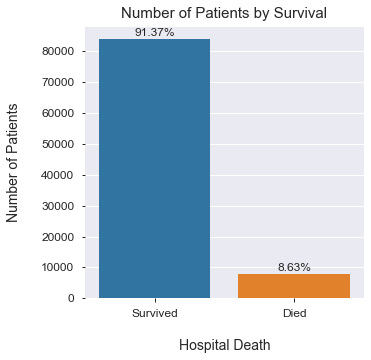

In [5]:
fig, ax = plt.subplots(figsize=(5,5))
plot = sns.countplot(x='hospital_death', 
                     data=train, 
                     ax=ax,
                     #palette="ch:2.5,-.2, dark=.3", #specify color
                    );

title_hos = 'Number of Patients by Survival'
plt.text(0.5, 90700, 
         title_hos,
         horizontalalignment = 'center',
         fontsize = 15)
plt.xlabel('Hospital Death', labelpad=20, fontsize=14)
plt.ylabel('Number of Patients', labelpad=20, fontsize=14)
hos = ('Survived','Died')
plt.xticks(np.arange(2), hos, fontsize=12)
plt.yticks(fontsize=12)

for p in plot.patches:
    plot.annotate('{0:.2%}'.format(p.get_height()/len(train)),
                  (p.get_x()+p.get_width()/2,
                   p.get_height()+1000),
                   ha="center",
                   fontsize=12)

3. <h3>Most patients are between 60 and 89 years old</h3>

     <code>age</code> **vs.** <code>hospital_death</code>
    
     - Age Distribution: 15 to 89 years old

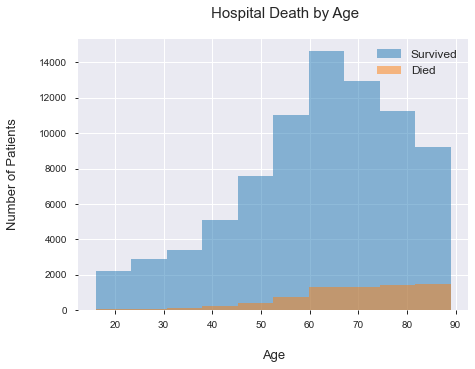

In [6]:
fig,ax = plt.subplots(figsize=(7,5))
labels = ['Survived','Died']
train.groupby('hospital_death').age.hist(alpha=0.5)
plt.legend(labels,fontsize=12)
plt.xlabel('Age',labelpad=20,fontsize=13)
plt.ylabel('Number of Patients',labelpad=20,fontsize=13)
title_age = 'Hospital Death by Age'
plt.text(55,16500,title_age,
        horizontalalignment='center',
        fontsize=15);

4. **Most patients are admitted through Accident & Emergency, Operating Room/Recovery, and Floor**
   
   <code>icu_admit_source</code> **vs.** <code>hospital_death</code>
    
   - Around 50% of the patients are admitted through **Accident & Emergency**
   - The other half majority of the patients are admitted through **Operating Room/Recovery** and **Floor**

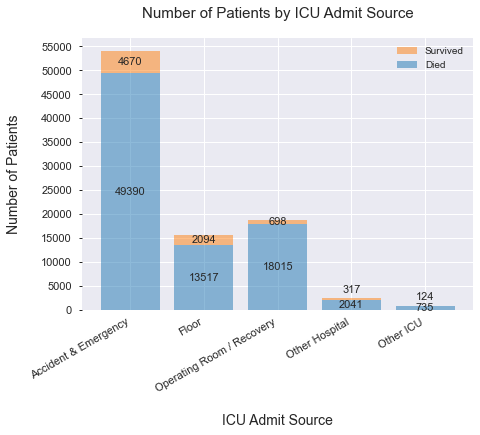

In [7]:

icu = pd.crosstab(train.icu_admit_source, train.hospital_death).sort_values(by=[1], ascending=False)

icu_1 = icu.plot.bar(figsize=(7,5),
                     stacked=True,
                     width=0.8,
                     #color=['#007acc', '#b8cc00'], #specify color
                     alpha=0.5)

icu_1.set_title('Number of Patients by ICU Admit Source',
                pad=20,
                fontsize=15)

icu_1.tick_params(labelsize=11)
plt.xlabel('ICU Admit Source', labelpad=20, fontsize=14)
plt.ylabel('Number of Patients', labelpad=20, fontsize=14)
y_ticks = np.arange(0, 60000, 5000)
plt.yticks(y_ticks)
plt.xticks(rotation=30, va="top", ha="right")
plt.tick_params(axis='x', length=0)

for i, x in zip(range(0, len(icu_1.patches)), icu_1.patches):
    height = x.get_height()
    if i in [0, 1, 2, 3, 4]:
        icu_1.text(x.get_x()+x.get_width()/2,
                    x.get_y()+height/2 ,
                    format(int(height)),
                    ha='center',
                    va='center',
                    fontsize=11)
    elif i in [5, 6, 7]:
        icu_1.text(x.get_x()+x.get_width()/2,
                    x.get_y()+height/2,
                    format(int(height)),
                    ha='center',
                    va='center',
                    fontsize=11)
    else:
        icu_1.text(x.get_x()+x.get_width()/2,
                    x.get_y()+height/2 + 2000,
                    format(int(height)),
                    ha='center',
                    va='center',
                    fontsize=11)    
        
handles, labels = icu_1.get_legend_handles_labels()
icu_1.legend(reversed(handles), ['Survived','Died']);

5. **Most patients are admitted through Med-Surg ICU**
    
    <code>icu_type</code> **vs.** <code>hospital_death</code>

   - Around 50% of the patients stayed in **Med-Surg ICU**


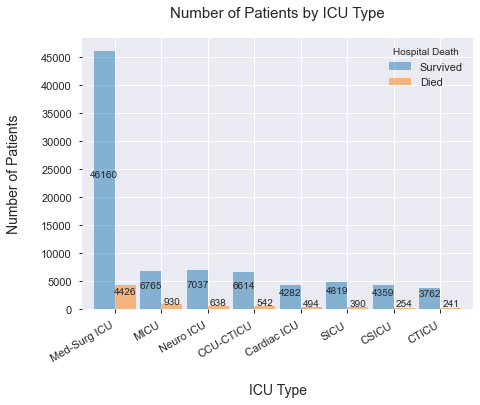

In [8]:
icu = pd.crosstab(train.icu_type,train.hospital_death).sort_values(by=[1], ascending=False)

icu_1 = icu.plot.bar(figsize=(7,5),
                     width=0.9,
                     #color=['#007acc', '#b8cc00'],#specify color
                     alpha=0.5)

icu_1.set_title('Number of Patients by ICU Type',
                pad=20,
                fontsize=15)
labels = ['Survived','Died']
legend = plt.legend(labels,
                    ncol=1, 
                    title="Hospital Death",
                    fontsize=11)

icu_1.tick_params(labelsize=11)
plt.xlabel('ICU Type', labelpad=20, fontsize=14)
plt.ylabel('Number of Patients', labelpad=20, fontsize=14);
y_ticks = np.arange(0,50000,5000)
plt.yticks(y_ticks)
plt.xticks(rotation=30, va="top", ha="right")
                
for x in icu_1.patches:
    height = x.get_height()
    icu_1.text(x.get_x()+x.get_width()/2,
               x.get_y()+height/2+20,
               format(height),
               ha='center',
               va='bottom',
               fontsize=10)

6. **Most patients are diagnosed with Cardiovascular, Neurological, Respiratory, and Sepsis diseases**
    
    <code>apache_3j_bodysystems</code> **vs.** <code>hospital_death</code>

   - Around 50% of the patients are diagnosed with **Cardiovascular**, **Neurological**, **Respiratory,** and **Sepsis** diseases


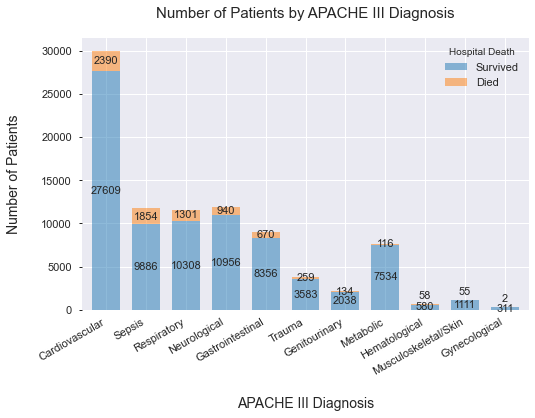

In [9]:
apache = pd.crosstab(train.apache_3j_bodysystem,train.hospital_death).sort_values(by=[1], ascending=False)

apache_1 = apache.plot.bar(figsize=(8,5),
                           width=0.7,
                           stacked=True,
                           #color=['#007acc', '#b8cc00'],
                           alpha=0.5)

apache_1.set_title('Number of Patients by APACHE III Diagnosis',
                   pad=20,
                   fontsize=15)

legend = plt.legend(labels,
                    ncol=1,
                    title="Hospital Death",
                    fontsize=11)

apache_1.tick_params(labelsize=11)
plt.xlabel('APACHE III Diagnosis',labelpad=20,fontsize=14)
plt.ylabel('Number of Patients',labelpad=20,fontsize=14);
y_ticks = np.arange(0,35000,5000)
plt.yticks(y_ticks)
plt.xticks(rotation=30, va="top", ha="right")
plt.tick_params(axis='x', length=0)

for i, x in zip(range(0, len(apache_1.patches)), apache_1.patches):
    height = x.get_height()
    if i <= 10:
        apache_1.text(x.get_x()+x.get_width()/2,
                      x.get_y()+height/2,
                      format(int(height)),
                      ha='center',
                      va='center',
                      fontsize=11)
    elif not (i>18):
        apache_1.text(x.get_x()+x.get_width()/2,
                      x.get_y()+height/2,
                      format(int(height)),
                      ha='center',
                      va='center',
                      fontsize=11)
    else:
        apache_1.text(x.get_x()+x.get_width()/2,
                      x.get_y()+height/2 + 1000,
                      format(int(height)),
                      ha='center',
                      va='center',
                      fontsize=11)

7. **20 out of 183 variables are strongly related to Hospital Death** 
   
   CORRELATION MATRIX
   - Hospital Death vs. variables with correlation *less or equal to -0.2* and *greater or equal to 0.2*


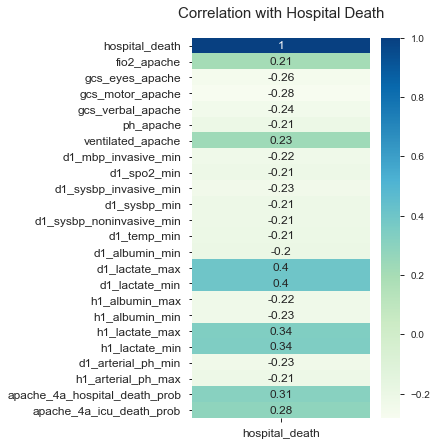

In [10]:
col = 'hospital_death'
df_corr_mean_gross = train[train.columns[0::]].corr()[col]
df_corr_mean_gross = df_corr_mean_gross[(df_corr_mean_gross>=0.2) | (df_corr_mean_gross<=-0.2)]
fig, ax = plt.subplots(figsize=(4,7))
heat = sns.heatmap(df_corr_mean_gross.to_frame(),
                   annot=True,
                   annot_kws={'size':12},
                   cmap="GnBu") # plot matrix
heat.set_title('Correlation with Hospital Death',
               pad=20,
               fontsize=15)

heat.tick_params(labelsize=12)
plt.show();

#### 8A. **Around 40% of the variables have over 50% of missing values** 
   
  MISSING VALUES
  - Around 40% columns (74 out of 185 variables) have over **50%** of missing values
  - Around 76% of the 74 variables have over **70%** of missing values
 
*Note: click the graph twice to enlarge*

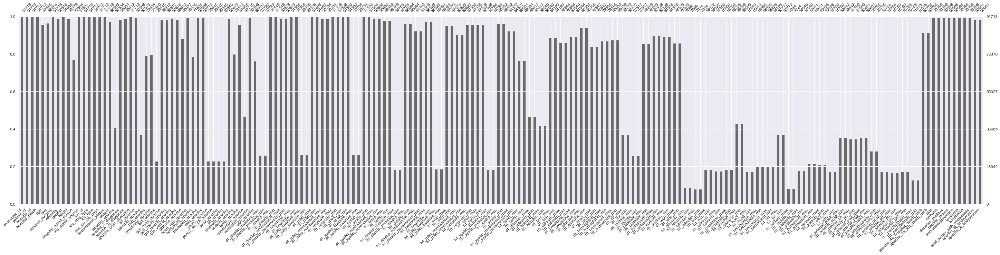

In [11]:
_=msno.bar(train, labels=True, fontsize=12, figsize=(50, 10))

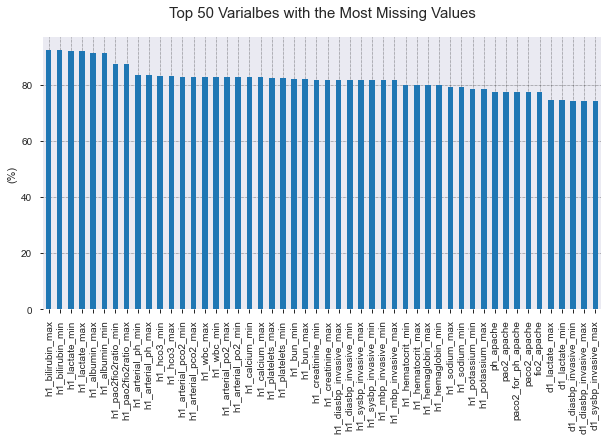

In [12]:
def assess_NA(data):
    """
    
    Returns a dataframe denoting the total number of NA values and the percentage of NA values in each column.
    The column names are notes on the index.
    
    Parameters
    ----------
    data: dataframe
    
    """
    #pandas series denoting features and the sum of their null values
    null_sum = data.isnull().sum()
    
    #instantiate columns for missing data
    total = null_sum
    percent = (((null_sum/len(data.index))*100).round(2))
    
    #concatenate along the columns to create the complete dataframe
    train_NA = pd.concat([total,percent],axis=1,keys=['Number of NA','Percent NA'])
    
    #drop rows that don't have any missing data
    train_NA = train_NA[(train_NA.T !=0).any()].sort_values(ascending=False, by='Percent NA')
    
    return train_NA

fig, ax = plt.subplots(figsize=(10,5))
(assess_NA(train)['Percent NA'][:50]
 .plot.bar()
 .set_title('Top 50 Varialbes with the Most Missing Values',
            pad=20,
            fontsize=15)
)

plt.ylabel('(%)')


ax.grid(which='major', linestyle=':', linewidth='0.5', color='black');

8B. **APACHE II AND APACHE III admission diagnosis groups and APACHE II diagnosis for ICU admission are highly correlated in nullity**
  
  NULLITY CORRELATION 
 - It is measured through the dendrogram
 
*Note: click the graph twice to enlarge*
    

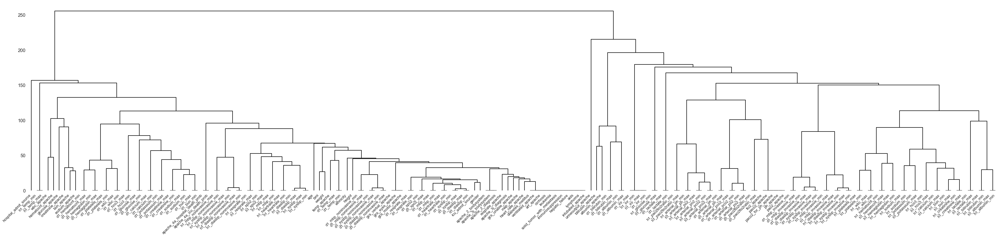

In [13]:
data = train[list(assess_NA(train).index)]#[:50]
_=msno.dendrogram(data, fontsize=13, figsize=(60, 12), orientation='top')

9. **Patients who did not survive have a higher average death probability, but there are also some outliers (survived patients) with high death probabilities**

    <code>apache_4a_hospital_death_prob</code> **vs.** <code>hospital_death</code>
    
    - Most survived patients have around 0% to 20% of death probability
    - Most dead patients have around 20% to 40% of death probability

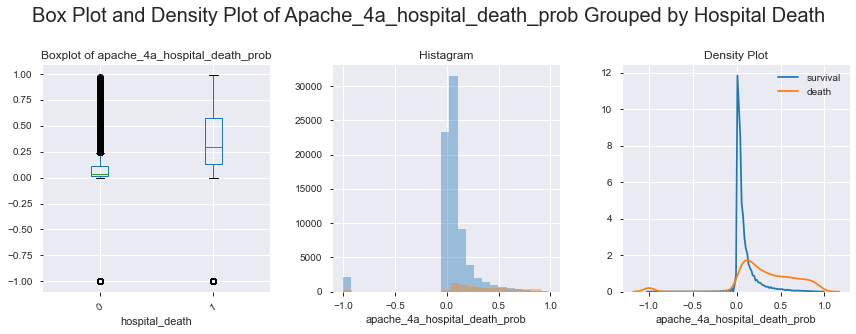

In [14]:
col = 'apache_4a_hospital_death_prob'
fig = plt.figure(figsize=(12, 8))
ax1 = plt.subplot(231)
ax2 = plt.subplot(232)
ax3 = plt.subplot(233)
box = train.boxplot(col, 'hospital_death', rot = 30, ax=ax1)

ax1.title.set_text('Boxplot of apache_4a_hospital_death_prob')
sns.distplot(train[(train['hospital_death']==0)][col], bins =25, kde=False, norm_hist=False, ax=ax2, label="survival")
sns.distplot(train[(train['hospital_death']==1)][col], bins =25, kde=False, norm_hist=False, ax=ax2, label="death")

ax2.title.set_text('Histagram')
sns.distplot(train[(train['hospital_death']==0)][col], bins =25, kde=True, hist=False, norm_hist=True, ax=ax3, label="survival")
sns.distplot(train[(train['hospital_death']==1)][col], bins =25, kde=True, hist=False, norm_hist=True, ax=ax3, label="death")
ax3.title.set_text('Density Plot')

plt.legend()
fig.suptitle('Box Plot and Density Plot of ' + col.capitalize() +' Grouped by Hospital Death', fontsize=20)
fig.tight_layout()
fig.subplots_adjust(top=0.88);

10. **Most of the patients' have pre icu los days of half a day**

    <code>pre_icu_los_days</code> is patients' length of stay between hospital and unit admission.
    
    Here we show the Summary Statistics of pre_icu_los_days, segment it to bins, and plot the histogram.

    - There are negative values as small as -24 days, as large as 159 days and 3711 zero-day.
    - After transforming days into hours and segmenting into 7 parts, most cases fall into the first 10 hours.
    - 0.84% negative cases and 4.04% zero cases in the training dataset
        - The negative values mean the unit admission is prior than hospital admission:
        - Is it possible that hospital admission is later than unit admission due to an emergency? So it is somehow a wrong record?


In [15]:
# Summary Statistics of column pre_icu_los_days Comparing with Unit Day

print('Summary Statistics of column', col, 'Comparing with Unit Day')
col= 'pre_icu_los_days'
data1 = train[[col]]
des1_1 = data1.describe()
des1_2 = (data1<0).sum().to_frame(name = 'negative').T
des1_3 = (data1==0).sum().to_frame(name = 'zero').T
des1_4 = data1.isnull().sum().to_frame(name = 'missing').T

data2 = train[[col]]*24
des2_1 = data2.describe()
des2_2 = (data2<0).sum().to_frame(name = 'negative').T
des2_3 = (data2==0).sum().to_frame(name = 'zero').T
des2_4 = data2.isnull().sum().to_frame(name = 'missing').T

pd.merge(pd.concat([des1_1, des1_2, des1_3, des1_4]), pd.concat([des2_1, des2_2, des2_3, des2_4]), left_index=True, right_index=True,
         suffixes=(' (day)', ' (hour)'))

Summary Statistics of column apache_4a_hospital_death_prob Comparing with Unit Day


,pre_icu_los_days (day),pre_icu_los_days (hour)
count,91713.000000,91713.000000
mean,0.835766,20.058385
std,2.487756,59.706148
min,-24.947222,-598.733333
25%,0.035417,0.850000
50%,0.138889,3.333333
75%,0.409028,9.816667
max,159.090972,3818.183333
negative,778.000000,778.000000
zero,3711.000000,3711.000000


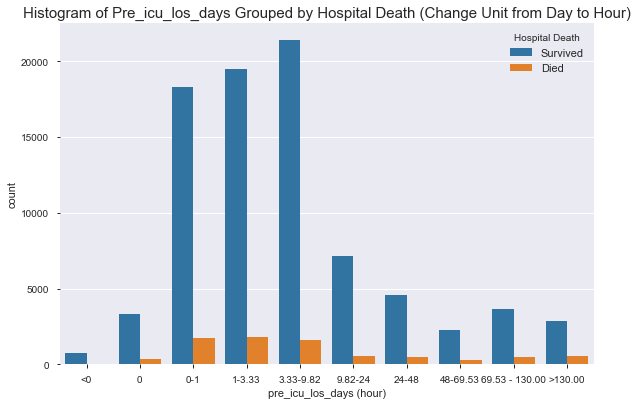

In [16]:
col= 'pre_icu_los_days'
data = train.copy()
data[col] = data[col]*24

bins = [-600, -0.000001, 0, 1, 3.33, 9.82, 24, 48, 69.53, 130, 3820]
group_names = ['<0', '0', '0-1', '1-3.33', '3.33-9.82', '9.82-24', '24-48', '48-69.53', '69.53 - 130.00', '>130.00']
data[col] = pd.cut(data[col], bins, labels=group_names)

_=sns.catplot(x=col, data=data,
              kind="count", hue="hospital_death", 
              # palette="ch:.25",
              height=5.5, # make the plot 5 units high
              aspect=1.5,
              legend=False) # height should be three times width);#, ax=ax1

plt.xlabel('pre_icu_los_days (hour)')
plt.title('Histogram of ' + col.capitalize() +' Grouped by Hospital Death (Change Unit from Day to Hour)', fontsize=15)
legend = plt.legend(labels,
                    ncol=1,
                    title="Hospital Death",
                    fontsize=11);

<h1> <a id="data_preprocessing">3. Data Wrangling and Preprocessing</a></h1>

[Back](#outline)

    
   ## Following Variables are Preprocessed:



1. <code>encounter_id</code>: set it as **index** since it is a unique identifier
2. <code>hospital_admit_source, apache_2_bodysystem</code>: merge and change names of their subclasses to make them more concise
3. <code>apache_4a_hospital_death_prob, apache_4a_icu_death_prob</code>: fillna by each other
4. **Drop 59 columns** due to high correlations
5. <code>age, height, weight, bmi, hospital_admit_source, apache_4a_hospital_death_prob, apache_4a_icu_death_prob </code>: **Impute NaN** by different strategies: numeric varaibles are filled with median or mean & categorical variables are filled with NAN
6. Change factor variables into **dummy variables**

Code for preprocessing:

In [17]:
def hospital_source_observation(df, tag=None, train=None):
    
    """
    
    Returns a dataframe without observation and update it with the most logical guess.
    
    Parameters
    ----------
    df: dataframe
    
    """
    
    #Fill missing values in the hospital admit source with ICU admit source
    df_hos_NA = df[df['hospital_admit_source'].isna()==True]    
    
    #for the rows with missing value in the training data set's hospital admit source
    for i in df_hos_NA.index:
        
        #if the icu amdit source is Accident & Emergency
        if df.loc[i,'icu_admit_source']=='Accident & Emergency':
            #hospital admit source is filled with Emergency Department
            df.loc[i,'hospital_admit_source'] = 'Emergency Department'
        
        #if the icu admit source is Operating Room/Recovery
        elif df.loc[i,'icu_admit_source'] == 'Operating Room / Recovery':
            #if there is post operation, fill it with Operating Room
            if df.loc[i,'apache_post_operative'] == 1:
                df.loc[i,'hospital_admit_source'] = 'Operating Room'
            #if not, fill it with Recovery Room
            else:
                df.loc[i,'hospital_admit_source'] = 'Recovery Room'
        #Fill the rest of the hospital admit source with ICU admit source
        else:
            df.loc[i,'hospital_admit_source'] = df.loc[i,'icu_admit_source']
                
    observation = df[df['hospital_admit_source']=='Observation']
    
    for i in observation.index:
        
        if df.loc[i,'icu_admit_source']!='Floor':
            if df.loc[i,'icu_admit_source']=='Operating Room / Recovery':
                if df.loc[i,'apache_post_operative'] == 0:
                    df.loc[i,'hospital_admit_source'] = 'Operating Room'
                else:
                    df.loc[i,'hospital_admit_source'] = 'Recovery Room'
         
            else:
                df['icu_type'] = df['icu_type'].str.lower()
                if df.loc[i,'icu_type'].find('s')!= -1:
                    if df.loc[i,'apache_post_operative'] == 0:
                        df.loc[i,'hospital_admit_source'] = 'Operating Room'
                    else:
                        df.loc[i,'hospital_admit_source'] = 'Recovery Room'
                else:
                    df.loc[i,'hospital_admit_source'] = 'Emergency Department'
                        
        else:
            df.loc[i,'hospital_admit_source'] = df.loc[i,'icu_admit_source']
            
    # Fill NaN of hospital_admit_source by using most frequent value in icu_type  
    imputer = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')
    imputer.fit(df['hospital_admit_source'].values.reshape(-1, 1)) 
    if tag == 'train':
        df['hospital_admit_source'] = imputer.transform(df['hospital_admit_source'].values.reshape(-1, 1))
    else:
        most_freq = train['hospital_admit_source'].value_counts().keys()[0]
        df['hospital_admit_source'] = df['hospital_admit_source'].fillna(most_freq)

    return df


def data_processing(df, train, change_to_cat, excludeColumns, tag):
    """
    This function creates a vector of zeros of shape (dim, 1) for w and initializes b to 0.
    
    Parameters:
    ----------
    df             -- the dataframe we want to preprocess (either training or test dataset)
    train          -- training dadataframe, used to fillna for testing dataframe
    change_to_cat  -- a list of column names which used to transfer to categorical/object data type
    excludeColumns -- a list of column names to filter out from the furture predictors list
    tag            -- a label to indicate the dataframe used to preprocess is training or test dataframe
    
    Returns:
    ----------
    case 1: when tag=='train'
    df             -- the dataframe we done the preprocessing
    excludeColumns -- a list of column names to filter out from the furture predictors list
    change_to_cat  -- a list of column names which used to transfer to categorical/object data type
    
    case 2: when tag=='test'
    df             -- the dataframe we done the preprocessing
    """ 
    
    ### Rename name of subclasses of hospital_admit_source and apache_2_bodysystem
    
    print('- Revise hospital_admit_source, and apache_2_bodysystem')
    df['hospital_admit_source'] = df['hospital_admit_source'
                                    ].replace( {'Other ICU': 'ICU', 
                                                'ICU to SDU':'SDU', 
                                                'Step-Down Unit (SDU)': 'SDU',
                                                'Other':'Other Hospital', 
                                                'Observation': 'Recovery Room',
                                                'Acute Care/Floor': 'Acute Care'} )
    
    df['apache_2_bodysystem'] = df['apache_2_bodysystem'].replace( {'Undefined diagnoses': 'Undefined Diagnoses'})
    
    
    ### Revise hospital_id & icu_id
    
    print('- Transfer icu_id and hopstipal_id to categorical data')
    if tag=='train':
        change_to_cat.append('icu_id')
        change_to_cat.append('hospital_id')
    
    
    ### Exclude collinear (highly correlated) features
    # Exclude collinear features by dropping columns with correlations above threshold
    
    if tag == 'train':
        
        # Threshold for removing correlated variables
        threshold = 0.9 
        
        # Absolute value correlation matrix 
        corr_matrix = df.drop(columns='hospital_death').corr().abs() 
        
        # Upper triangle of correlations
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
        
        # filter out columns by assinged criteria
        to_drop = set( [column for column in upper.columns if any(upper[column] > threshold)] )
        
        print('- There are %d columns to remove due to high correlation with threshold=0.9' % (len(to_drop)))

        # record these columns into the list excludeColumns
        excludeColumns = excludeColumns.union(to_drop)

    
    ### Deal with missing values
    
    ## fillna in height/weight/bmi
    
    print('- Fill NaN of age, height, weight, and bmi by grouping ethnicity and gender')
    # process training dataframe
    if tag=='train':
        df['age'] = df['age'].fillna(df['age'].median())
        df['height'] = df.groupby(['ethnicity', 'gender'])['height'].apply(lambda x: x.fillna(x.median()))  
        df['weight'] = df.groupby(['ethnicity', 'gender', 'height'])['weight'].apply(lambda x: x.fillna(x.median())) 
        
    # process test dataframe
    # Fill NaN of age, height, weight, and bmi by values from training data set
    else:
        df['age'] = df['age'].fillna(train['age'].median())
        df['height'] = df['height'].fillna(train.groupby(['ethnicity', 'gender'])['height'].transform('median'))
        df['weight'] = df['weight'].fillna(train.groupby(['ethnicity', 'gender', 'height'])['weight'].transform('median'))
    
    df['bmi'] = df.apply( lambda x: x['weight']/(0.01 * x['height'])**2 if np.isnan(x['bmi']) else x['bmi'], axis=1)
    
    
    ## fillna for hospital_admit_source
    
    print('- Fill NaN of hospital_admit_source by using icu_type')
    if tag == 'train':
        df = hospital_source_observation(df, tag)
    else:
        df = hospital_source_observation(df, tag, train)

        
    ## fillna for apache_4a_hospital_death_prob and apache_4a_icu_death_prob
    
    print('- Fill NaN of apache_4a_hospital_death_prob and apache_4a_icu_death_prob by each other')
    df['apache_4a_hospital_death_prob'
        ] = pd.DataFrame(df.loc[:,['apache_4a_hospital_death_prob', 'apache_4a_icu_death_prob']
                                 ].apply(lambda x: x['apache_4a_icu_death_prob'] \
                                         if np.isnan(x['apache_4a_hospital_death_prob']) \
                                         else x['apache_4a_hospital_death_prob'], 
                                         axis=1))
    df['apache_4a_icu_death_prob'
        ] = pd.DataFrame(df.loc[:,['apache_4a_hospital_death_prob', 'apache_4a_icu_death_prob']
                                 ].apply(lambda x: x['apache_4a_hospital_death_prob'] \
                                         if np.isnan(x['apache_4a_icu_death_prob']) \
                                         else x['apache_4a_icu_death_prob'], 
                                         axis=1))
    
    
    ### Preprocess categorical variables
    # For some object columns such as apache_2_diagnosis will be identified as float
    # I did the following work to exclude the dot sign derived from float format
    
    for col in change_to_cat:
        if (df[col].dtype == 'O'):
            df[col] = df[col].astype('object')
        else:
            # modify float to interger for numerical factors
            df[col] = df[col].fillna(-9999)
            df[col] = df[col].astype('str').str.replace('.','')
            df[col] = df[col].replace('-9999', np.nan) 
    
    
    ### Dealing with categorical variables
    # Transforming object variables into dummy variables
    # By assigning dummy_na=True, it will automatically generate null column for each
    # variable
    
    print('- Change categorical data into dummies')       
    df = pd.get_dummies(df, columns=change_to_cat, dummy_na=True, drop_first=False)  
    
    
    ### Checking for columns with only one value
    print('- Drop the following columns due to containing only one value: ')
    if tag=='train':
        i = 0
        for col in df.columns:
            if df[col].nunique() == 1:
                excludeColumns.add(col)
                if i==0:
                    print("=> ["+col, end=', ')
                else:
                    print(col, end=', ')
                i+=1
        print(']')
    
    
    ### Rename columns
    # In order to avoid plot error, I rename columns by replacing space into underscore
    df.columns = df.columns.str.replace(" ", "_")
    
    
    if tag == 'train':
        return df, excludeColumns, change_to_cat
    else:
        return df 
    

# list of categorical columns
change_to_cat = ['ethnicity', 'gender', 'hospital_admit_source',
                 'icu_admit_source', 'icu_stay_type', 'icu_type',
                 'apache_3j_diagnosis', 'apache_2_diagnosis',
                 'apache_3j_bodysystem', 'apache_2_bodysystem']

# list of unwanted columns
excludeColumns = ['hospital_death', 'patient_id']

outcome = 'hospital_death'

# data pre-processing for training data
train, excludeColumns, change_to_cat = data_processing( filePath('training_v2.csv', 'encounter_id'), 
                                                        pd.DataFrame(), 
                                                        change_to_cat, 
                                                        set(excludeColumns), 
                                                        'train')
# data pre-processing for testing data
# io.capture_output() can surpress print function to avoid duplicated information in both train and test data processing
with io.capture_output() as captured:
    test = data_processing( filePath('unlabeled.csv', 'encounter_id'),
                            filePath('training_v2.csv','encounter_id'), 
                            change_to_cat, 
                            excludeColumns, 
                            'test')

- Revise hospital_admit_source, and apache_2_bodysystem
- Transfer icu_id and hopstipal_id to categorical data
- There are 59 columns to remove due to high correlation with threshold=0.9
- Fill NaN of age, height, weight, and bmi by grouping ethnicity and gender
- Fill NaN of hospital_admit_source by using icu_type
- Fill NaN of apache_4a_hospital_death_prob and apache_4a_icu_death_prob by each other
- Change categorical data into dummies
- Drop the following columns due to containing only one value: 
=> [readmission_status, hospital_admit_source_nan, icu_stay_type_nan, icu_type_nan, apache_3j_diagnosis_nan, apache_2_diagnosis_nan, icu_id_nan, hospital_id_nan, ]


After the pre-processing work is done, now we split the data into training (80%) and validation (20%) datasets for modeling usage, and prepare the test data for model prediction.

In [18]:
print('Split data into training and validation, and check the alignment of used columns in training and test datasets')
print()

### Generate predictors and outcome variable for model usage
predictors = [s for s in train.columns if s not in excludeColumns]
outcome = 'hospital_death'
X = train[predictors]
y = train[outcome]

### Split dataset into training and testing
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.20, random_state = 2020)

# X_test = test[predictors]
cols_when_model_builds  = set(X_train.columns)
X_test= test.copy()
for col in set(cols_when_model_builds).difference(X_test.columns):
    X_test[col] = np.nan
X_test = X_test[cols_when_model_builds]
X_test = X_test[X_train.columns]

Split data into training and validation, and check the alignment of used columns in training and test datasets



<h1> <a id="model">4. Modeling</a></h1>

[Back](#outline)

We have tried **Logistic Regression**, **Random Forest**, **XGBoost**, and **LightGBM** (another similar ensemble learning algorithm). XGBoost performs the best due to its ensemble tree-based algorithm and hyper-parameters tuning options.

<h2>Definition of XGBoost</h2>

XGBoost is short for **Extreme Gradient Boosting**. It is an efficient implementation of the stochastic gradient boosting machine learning algorithm. It grows trees' depth and controls model complexity by max_depth.


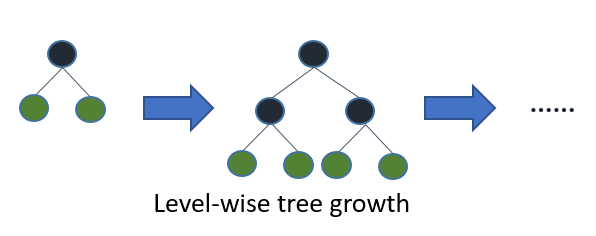

<h3>Key Parameters of XGBoost</h3>

|Type              |Parameters      | Value           |  Meaning |
|:--               |:--             |:--:             |:--       |
|General Parameters|booster         |gblinear/gbtree/dart |Booster options; gbtree & dart use tree based models ; gblinear uses linear functions|
|Learning Task Parameters|objective |binary:logistic  |logistic regression for binary classification, output probability; Specify the learning task and the corresponding learning objective or a custom objective function to be used|
|Scikit-Learn API  |n_estimators    |[1, ∞]           | Number of gradient boosted trees. Equivalent to number of boosting rounds.|
|For Tree Booster  |learning_rate   |[0,∞]            |Corresponds to the shrinkage of the weights associated to features after each round; it defines the amount of "correction" we make at each step. Boosting learning rate (xgb’s “eta”)|
|For Tree Booster  |max_depth       |[1, ∞]           |The maximum number of nodes from the root to the farthest leaf of a tree. Deeper trees means more complex relationships. As tree deepens, splits are less relevant and likely to overfit|
|For Tree Booster  |subsample       |(0, 1]           |Corresponds to the fraction of observations (the rows) to subsample at each step. By default it is set to 1 meaning that we use all rows. Smaller is usually better/Typical 0.7|
|For Tree Booster  |colsample_bytree|[0, 1]           |Corresponds to the fraction of features (the columns) to use. By default it is set to 1 meaning that we will use all features. Smaller is usually better/Typical: 0.70.|
|For Tree Booster  |gamma           |[0,∞]            |Minimum loss reduction required to make a further partition on a leaf node of the tree. The larger gamma is, the more conservative the algorithm will be.|
|For Tree Booster  |scale_pos_weight|[0,∞]            |Control the balance of positive and negative weights, useful for unbalanced classes. A typical value to consider: sum(negative instances) / sum(positive instances)|

### Note:
    
- Since XGBoost **cannot handle categorical features** and only accepts numerical values, like Random Forest, we proceeded encodings by transferring the factor varialbes into **dummy** variables in **3. Data Wrangling and Preprocessing**.


<h2>
<a id='xgb_model_1'>4A Building a Baseline Model</a>
</h2>    

#### 1. Fit the model on the training data
#### 2. Evaluate the model performance by validation data
#### 3. Use the **AUC (Area Under The Curve) ROC (Receiver Operating Characteristics)** as the main evaluation metric <code>eval_metric</code>.
[Back](#outline)

<h3> 1. Fit the model on the training data</h3>

In [19]:
def xgbModel(modelFile, logName, mode='write', params={}, \
             X_train=X_train, y_train=y_train, X_valid=X_valid, \
            verbose=100, early_stopping_rounds=False):
    """
    
    This function creates a XGBoost model and save the model and process to pickle files.
    It will print the process from logName file.
    
    Argument:
    --------
    modelFile -- name of model used to save in pickle file
    logName   -- name of system output used to save in pickle file
    mode      -- choose to build a model or read a saved model
    params    -- a dictionary of the XGBoost parameter 
    X_train   -- split training data with predictors
    y_train   -- split training data with outcome variable
    X_valid   -- split validation data with predictors
    y_valid   -- split validation data with outcome variable
    verbose   -- If verbose and an evaluation set is used, writes the evaluation metric measured on the validation set 
    
    Returns:
    -------
    model     -- a trained XGBoost model
    
    """     

    if mode == 'write':
        model = xgb.XGBClassifier(**params)
        eval_set = [(X_train, y_train), (X_valid, y_valid)]


        fsock=open(logName,'w')
        sys_old_out_put=sys.stdout
        sys.stdout=fsock

        %time model.fit(X_train, y_train, \
                        eval_metric=["error", 'auc'], \
                        eval_set=eval_set, \
                        verbose=verbose)
        sys.stdout=sys_old_out_put
        fsock.close()

        pickle.dump(model, open(modelFile, "wb"))
    
    elif mode == 'read':
        model = pickle.load(open(modelFile, "rb"))
        f = open(logName)
        for line in f:
            print(line.replace('\t', ' '), end='')
        f.close()
    
    return model

In [20]:
# Build XGBoost model and save to pickle file
model = xgbModel('xgb_default.pickle', 'xgb_default.log', mode='write', verbose=50)

# Once having saved model, we can load pickle file instead of re-building it again
model = xgbModel('xgb_default.pickle', 'xgb_default.log', mode='read')
model

[0] validation_0-error:0.077661 validation_0-auc:0.794001 validation_1-error:0.076869 validation_1-auc:0.791428
[50] validation_0-error:0.069211 validation_0-auc:0.893754 validation_1-error:0.069018 validation_1-auc:0.881299
[99] validation_0-error:0.06579 validation_0-auc:0.907152 validation_1-error:0.068255 validation_1-auc:0.889164
Wall time: 12min 4s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

<h3>2. Evaluate the Baseline Model Performance</h3>

Here are the tree structure, classification error, ROC AUC, and feature importance plots.

1. After 100 rounds, the AUC curves of both data sets are still moving upward. We will increase the number of <code>n_estimators</code> for the next model, adding the number of trees to be used in the forest.

2. With the defalut setting <code>max_depth = 3</code>, the tree has three layers. <code>apache_4a_hospital_death_prob</code>, <code>apache_4a_icu_death_prob</code>, and <code>d1_lactate_min</code> are used for the splits, but does not quantify which feature is more important.

3. The feature importance demonstrates the improvement in accuracy each varialbe brings to its branch. From the Baseline Model, <code>apache_4a_icu_death_prob</code> is more important than <code>d1_lactate_min</code>.

In [21]:
def model_performance(model, plt_error_auc=True, plt_tree=True, plt_fi=True):
    """
    
    This function creates 4 plots including: 
    classification error rate, AUC, decision tree, and feature importance.
    
    Argument:
    --------
    model          -- the generated model (eg, xgb.XGBClassifier())
    plt_error_auc  -- whether to plot classification error rate and AUC
    plt_tree       -- whether to plot decision tree
    plt_fi         -- whether to plot feature importance

    Returns:
    --------
    None
    
    """     
    
    # print('Retrieve performance metrics from model and plot the evaluation metrics and feature importance.')
    results = model.evals_result()
    epochs = len(results['validation_0']['error'])
    x_axis = range(0, epochs)

    if plt_error_auc:
        fig = plt.figure(figsize=(12, 8))
        ax1 = plt.subplot(221)
        ax2 = plt.subplot(222)
        # fig.suptitle('Plot the Evaluation Metrics, First Tree in the Model and Feature Importance', fontsize=20)

        ## plot classification error
        ax1.plot(x_axis, results['validation_0']['error'], label='Train')
        ax1.plot(x_axis, results['validation_1']['error'], label='Test')
        ax1.yaxis.set_major_locator(MultipleLocator(0.025))
        ax1.yaxis.set_minor_locator(MultipleLocator(0.005))
        ax1.xaxis.set_minor_locator(MultipleLocator(100))
        ax1.set_ylim([0.000, 0.175]) #[0.015, 0.240]
        ax1.legend()
        ax1.grid(True)
        ax1.set_ylabel('Classification Error')
        ax1.title.set_text('XGBoost Classification Error Plot')

        # Don't allow the axis to be on top of your data
        ax1.set_axisbelow(True)
        # Turn on the minor TICKS, which are required for the minor GRID
        ax1.minorticks_on()
        # Customize the minor grid
        ax1.grid(which='minor', linestyle='-')
        ax1.grid(which='major', linestyle=':', color='grey')
        ax1.set_xlabel('n_estimator (number of rounds)')


        ## plot auc
        ax2.plot(x_axis, results['validation_0']['auc'], label='Train')
        ax2.plot(x_axis, results['validation_1']['auc'], label='Test')
        ax2.yaxis.set_major_locator(MultipleLocator(0.025))
        ax2.yaxis.set_minor_locator(MultipleLocator(0.005))
        ax2.xaxis.set_minor_locator(MultipleLocator(100))
        ax2.set_ylim([0.80, 1.0])
        ax2.legend()
        ax2.grid(True)
        ax2.set_ylabel('AUC')
        ax2.title.set_text('XGBoost AUC Plot')
        # Don't allow the axis to be on top of your data
        ax2.set_axisbelow(True)
        # Turn on the minor TICKS, which are required for the minor GRID
        ax2.minorticks_on()
        # Customize the minor grid
        ax2.grid(which='minor', linestyle='-')
        ax2.grid(which='major', linestyle=':', color='grey')# linewidth='0.2'
        ax2.set_xlabel('n_estimator (number of rounds)')

        plt.tight_layout()
        fig.subplots_adjust(top=0.88)
        plt.show();

    
    if plt_tree:
        xgb.plot_tree(model, num_trees=0, rankdir='LR') #, num_trees=3 , max_depth=6
        plt.title('The First Decision Tree in the Model', fontsize=20)
        fig = plt.gcf()
        fig.set_size_inches(30, 10);
        # # fig.savefig('tree.png')
        # plt.show()

    
    if plt_fi:
        ## Plot feature importance
        #Available importance_types = [‘weight’, ‘gain’, ‘cover’, ‘total_gain’, ‘total_cover’]
        func = 'gain'
        fig = plt.figure(figsize=(8, 10))
        # feat_imp = pd.Series(model.feature_importances_, index=X_train.columns).sort_values(ascending=True)
        feat_imp = pd.Series(model.get_booster().get_score(importance_type = func)).sort_values(ascending=True)
        feat_imp = feat_imp/np.sum(feat_imp)
        ax = sns.barplot(x=feat_imp.nlargest(50).values, y=feat_imp.nlargest(50).keys())
        # ax = sns.barplot(x=feat_imp.nlargest(50).keys(), y=feat_imp.nlargest(50).values)
        # plt.xticks(rotation=30, va="top", ha="right")
        plt.title('Feature Importances Plot - Top 50')
        plt.xlabel('Normalized Gain')
        plt.ylabel('Features')
        # plt.tight_layout()
        plt.show();

<h3> 3. Use the AUC (Area Under The Curve) ROC (Receiver Operating Characteristics) as the main evaluation metric </h3>

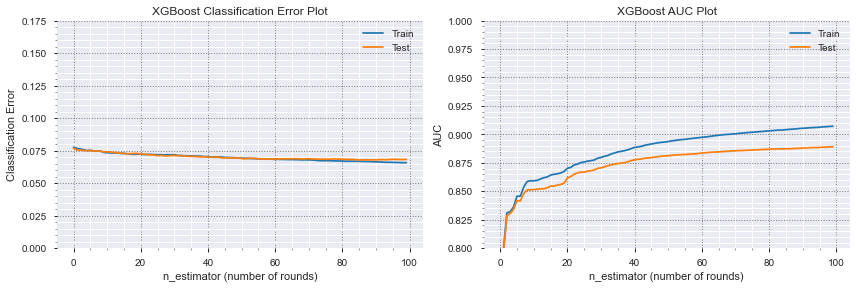

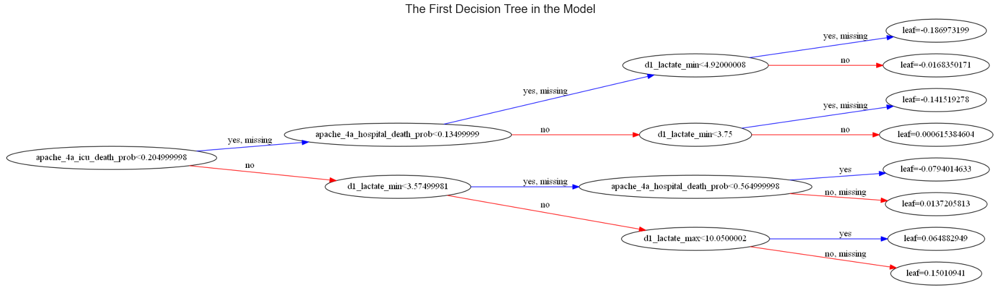

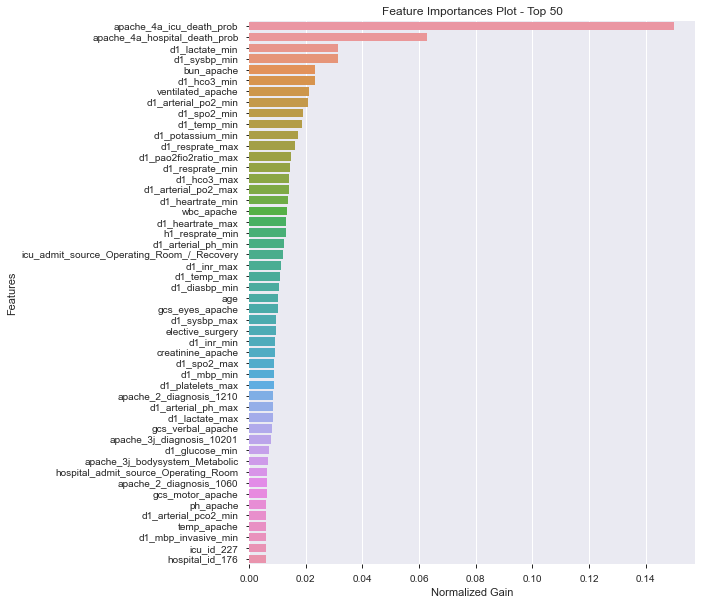

In [22]:
# Plot of model 1
model_performance(model)

<h2>
<a id='xgb_model_2'>4B Modified XGBoost Model (Model 2)</a>
</h2>  

[Back](#outline)

Since Model 1's performance can improve by tuning model parameters, we build Model 2 based on some of the parameters mentioned in the earlier table.

*Note that, <code>early_stopping_rounds=100</code> limits the number of rounds based on the AUC score of the validation set. 
With the setting, XGBoost stops at the best round in AUC score.*

In [23]:
# Model with update hyperparameters
params = {
    'n_estimators'      : 5000  , #default = 100
    'subsample'         : 0.8   , #default = 1
    'colsample_bytree'  : 0.4   , #default = 1  # many columns: 0.3 - 0.8 , a few columns: 0.8 - 1
    'random_state'      : 2020  ,
    'seed'              : 2020  ,  
}

# Build XGBoost model and save to pickle file
model = xgbModel('xgb_2.pickle', 'xgb_2.log', mode='write', params=params, 
                 verbose=50, early_stopping_rounds=100)

# Load saved model and outcome
model = xgbModel('xgb_2.pickle', 'xgb_2.log', mode='read')
model

[0] validation_0-error:0.07683 validation_0-auc:0.797412 validation_1-error:0.076269 validation_1-auc:0.792683
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 100 rounds.
[100] validation_0-error:0.066567 validation_0-auc:0.906512 validation_1-error:0.06771 validation_1-auc:0.889996
[200] validation_0-error:0.063187 validation_0-auc:0.918647 validation_1-error:0.066619 validation_1-auc:0.896426
[300] validation_0-error:0.060147 validation_0-auc:0.926386 validation_1-error:0.065311 validation_1-auc:0.898549
[400] validation_0-error:0.058103 validation_0-auc:0.933 validation_1-error:0.064929 validation_1-auc:0.900102
[500] validation_0-error:0.055827 validation_0-auc:0.938284 validation_1-error:0.065311 validation_1-auc:0.900613
[600] validation_0-error:0.053769 validation_0-auc:0.942736 validation_1-error:0.064929 validation_1-auc:0.901269
[700] validation_0-error:0.05216 validation_0-auc:0

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.4, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, n_estimators=5000, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=2020,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=2020,
              silent=None, subsample=0.8, verbosity=1)

<h3>Check Model Performance and Make Comparison</h3>

1. The validation set:
  - AUC Score improved from **0.8891 (baseline model) to 0.9016**. 
  - Error rate reduced from **0.0682 to 0.0658**.


2. From the feature importance plot, we get a different order of important features. The top 5 features compared to the default model shows in below table:

|Rank                           |Feature Name (Model2)        |Feature Name (Default Model)              |
|:--:                           |:--                          |:--                                       | 
|1                              |apache_4a_icu_death_prob     |apache_4a_hospital_death_prob             |
|2                              |apache_4a_hospital_death_prob|d1_lactate_min                            |
|3                              |d1_lactate_min               |pache_4a_icu_death_prob                   |
|4                              |d1_sysbp_min                 |ventilated_apache                         |
|5                              |bun_apache                   |icu_admit_source_Operating_Room_/_Recovery|

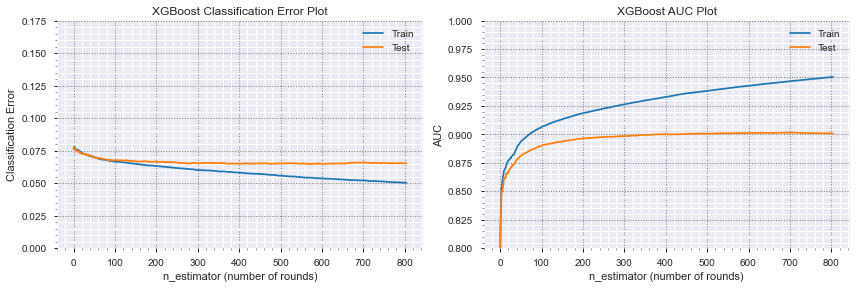

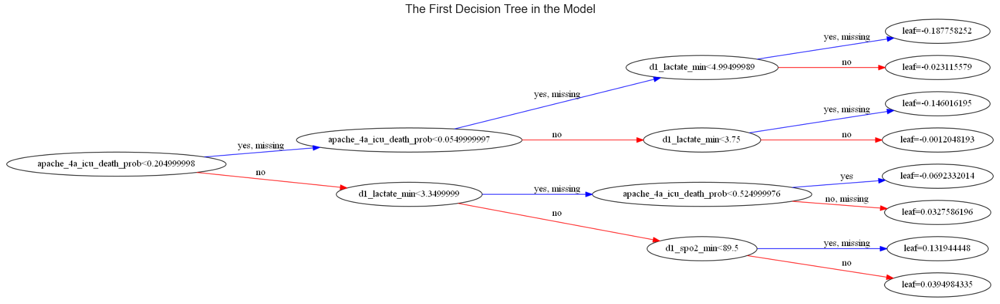

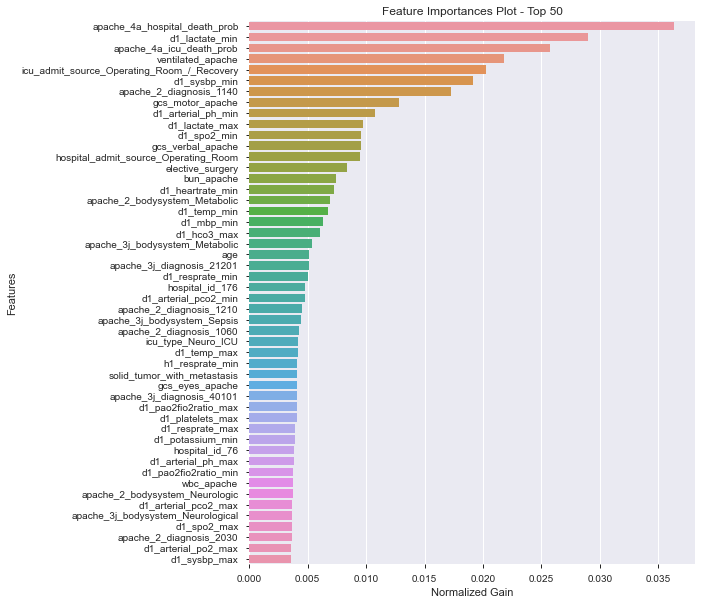

In [24]:
# Plot of model 2
model_performance(model)

<h1> <a id="hyperparameter">5. Hyperparameter Tuning</a></h1>

[Back](#outline)

Parameter tuning is critical to model improvement. The model can be manually adjusted or proceeded with hyper-parameter optimization methods to find optimum values. 

Since it is not clear the ideal parameters to obtain optimal outputs, we focused on the most commonly tuned ones: <code>n_estimators</code>, <code>subsample</code>, and <code>colsample_bytree</code>.

Here we're looking for the optimal value for <code>learning_rate</code>. We assign a list of 0.1 (default), 0.05, and 0.01 to <code>param_grid</code> of <code>GridSearchCV</code> and use AUC score to inspect the performance.

**learning_rate = 0.01** is the optimal value

In [25]:
# modelFile = "xgb_2_0.pickle"
gsFile = 'xgb_gs_2.pickle'
LogName = 'xgb_gs_2.log'


params_gs = {
    'learning_rate'     : [0.1, 0.05, 0.01]  , #default = 0.1  # typical range: 0.01 - 0.3
}


scoring = {'AUC': 'roc_auc', 
           'Accuracy': make_scorer(accuracy_score), 
           'neg_log_loss':make_scorer(log_loss)}


gs = GridSearchCV(model, 
                  param_grid=params_gs, 
                  cv = 5, 
                  verbose=100,
                  scoring=scoring, 
                  refit='AUC', 
                  return_train_score=True,
                  n_jobs = 4
                 )


fsock=open(LogName,'w')
sys_old_out_put=sys.stdout
sys.stdout=fsock

%time gs.fit(X, y)

sys.stdout=sys_old_out_put
fsock.close()

# Save model to file
pickle.dump(gs, open(gsFile, "wb"))


# Read saved file and outcome
gs = pickle.load(open(gsFile, "rb"))

f = open(LogName)
for line in f:
    print(line.replace('\t', ' '), end='')
f.close()

print();print()
print('Best value of {} = {}'.format(*gs.best_params_, *gs.best_params_.values()))

[CV] learning_rate=0.1 ...............................................
[CV] learning_rate=0.1 ...............................................
[CV] learning_rate=0.1 ...............................................
[CV] learning_rate=0.1 ...............................................
[CV]  learning_rate=0.1, AUC=(train=0.999, test=0.812), Accuracy=(train=0.990, test=0.880), neg_log_loss=(train=0.362, test=4.158), total=366.8min
[CV] learning_rate=0.1 ...............................................
[CV]  learning_rate=0.1, AUC=(train=0.999, test=0.875), Accuracy=(train=0.990, test=0.931), neg_log_loss=(train=0.355, test=2.391), total=368.1min
[CV] learning_rate=0.05 ..............................................
[CV]  learning_rate=0.1, AUC=(train=0.999, test=0.845), Accuracy=(train=0.989, test=0.886), neg_log_loss=(train=0.378, test=3.932), total=368.6min
[CV] learning_rate=0.05 ..............................................
[CV]  learning_rate=0.1, AUC=(train=0.999, test=0.868), Accura

<h1> <a id="cross_validation">6. Cross Validation</a></h1>

[Back](#outline)

Since XGBoost has its own cross-validation, we run the function <code>xgb.cv</code> to detect potential high variance issue. 
The cross-validation runs at each iteration and returns a mean and standard deviation of the chosen metric. The best number rounds can also be set using <code>early_stopping_rounds</code>.

- The **best number of num_boost_round is 7277** for the validation data
  - **mean:** 0.907538
  - **standard deviation:** 0.003375

In [26]:
## Run Cross Validation

LogName = 'xgb_cv_1_100.log'
cvFile = "xgb_cv_1_100.pickle"

dtrain = xgb.DMatrix(X, label = y)

params_cv = model.get_xgb_params()
params_cv.update(gs.best_params_)

fsock=open(LogName,'w')
sys_old_out_put=sys.stdout
sys.stdout=fsock
 
%time cv = xgb.cv(params_cv, \
                  dtrain, \
                  num_boost_round=50000, \
                  nfold=5, \
                  metrics=['auc'],\
                  early_stopping_rounds=100,\
                  stratified=True, \
                  seed=2020, \
                  verbose_eval=100)

sys.stdout=sys_old_out_put
fsock.close()

# Save model
pickle.dump(cv, open(cvFile, "wb"))


# Load saved model
cv = pickle.load(open(cvFile, "rb"))

f = open(LogName)
for line in f:
    print(line.replace('\t', ' '), end='')
f.close()

print();print()
print('Best number of num_boost_round = {}'.format(cv.shape[0]))

[0] train-auc:0.794641+0.00710212 test-auc:0.792238+0.00729039
[100] train-auc:0.86768+0.00172611 test-auc:0.864564+0.00808884
[200] train-auc:0.874976+0.00155186 test-auc:0.87164+0.00766706
[300] train-auc:0.881363+0.00139632 test-auc:0.877431+0.00726855
[400] train-auc:0.88714+0.00126542 test-auc:0.88221+0.00680172
[500] train-auc:0.892022+0.00129767 test-auc:0.886151+0.00622801
[600] train-auc:0.89609+0.0012762 test-auc:0.889248+0.00593065
[700] train-auc:0.899223+0.00124866 test-auc:0.891484+0.00572818
[800] train-auc:0.901808+0.0012071 test-auc:0.893186+0.00558789
[900] train-auc:0.904034+0.00114904 test-auc:0.894595+0.00544681
[1000] train-auc:0.905966+0.00109858 test-auc:0.895673+0.00532389
[1100] train-auc:0.907693+0.00103452 test-auc:0.896619+0.00520189
[1200] train-auc:0.909239+0.00101447 test-auc:0.89743+0.00509793
[1300] train-auc:0.910689+0.000975946 test-auc:0.898132+0.00501309
[1400] train-auc:0.912004+0.000976512 test-auc:0.898722+0.00492637
[1500] train-auc:0.913225+0.

In [27]:
# bottom 5 rows of cv output
cv.tail()

,train-auc-mean,train-auc-std,test-auc-mean,test-auc-std
7272,0.948722,0.000450,0.907535,0.003373
7273,0.948724,0.000449,0.907536,0.003374
7274,0.948728,0.000451,0.907536,0.003376
7275,0.948731,0.000451,0.907537,0.003375
7276,0.948736,0.000451,0.907538,0.003375


<h2> <a id="xgb_model_3">7. Final XGBoost Model</a></h2>

[Back](#outline)

The AUC score of the model using the best number of rounds from cross validation is not the optimal one. The score depends on the value of the <code>early_stopping_rounds</code> in xgb.cv and XGBoost model. 

For the final mode, we retrain it to determine the optimal rounds using the <code>early_stopping_rounds</code>. Small early_stopping_rounds 10 or 100. xgb.cv stops running earlier than 500 or 1000 rounds.
- **early_stopping_rounds=100**: AUC Score = 0.9042 at 7277 rounds
- **early_stopping_rounds=500**: AUC Score = 0.9045 at 8720 rounds


In [28]:
# Model 3-0 with the best rounds obtained from cross-validation

params = params_cv
params.update({'n_estimators': cv.shape[0]})


# build XGBoost model and save to pickle file
model = xgbModel('xgb_3_0.pickle', 'xgb_3_0.log', mode='write', params=params, 
                 verbose=1000, early_stopping_rounds=100)

# Load model and outcome
model = xgbModel('xgb_3_0.pickle', 'xgb_3_0.log', mode='read')
model

[0] validation_0-error:0.07683 validation_0-auc:0.797412 validation_1-error:0.076269 validation_1-auc:0.792683
[1000] validation_0-error:0.06643 validation_0-auc:0.906699 validation_1-error:0.066837 validation_1-auc:0.890217
[2000] validation_0-error:0.062328 validation_0-auc:0.919188 validation_1-error:0.065747 validation_1-auc:0.897198
[3000] validation_0-error:0.060052 validation_0-auc:0.927465 validation_1-error:0.065147 validation_1-auc:0.900121
[4000] validation_0-error:0.057639 validation_0-auc:0.933762 validation_1-error:0.065311 validation_1-auc:0.901939
[5000] validation_0-error:0.055459 validation_0-auc:0.939066 validation_1-error:0.064984 validation_1-auc:0.902988
[6000] validation_0-error:0.053714 validation_0-auc:0.943649 validation_1-error:0.064602 validation_1-auc:0.903769
[7000] validation_0-error:0.051983 validation_0-auc:0.947712 validation_1-error:0.064548 validation_1-auc:0.904183
[7276] validation_0-error:0.051452 validation_0-auc:0.948747 validation_1-error:0.064

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.4, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, n_estimators=7277, n_jobs=1,
              nthread=1, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=2020,
              silent=None, subsample=0.8, verbosity=1)

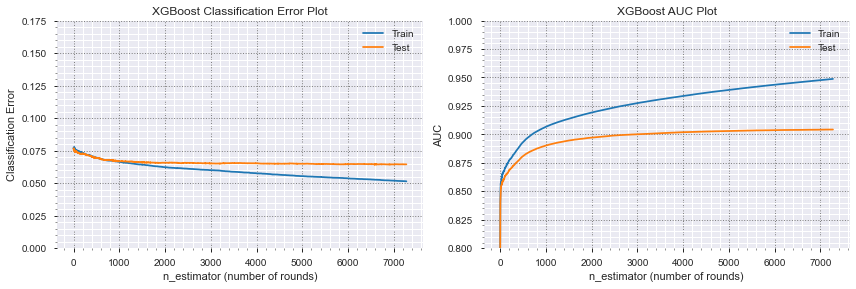

In [29]:
# Plot of Model 3-0 using cv's result 
model_performance(model, plt_error_auc=True, plt_tree=False, plt_fi=False)

Retrain the model by seeting up early_stopping_rounds=500 in XGBoost model

In [30]:
## Model 3-2 using early_stopping_rounds=500 to find optimal rounds 

params = params_cv
params.update({'n_estimators': 50000})


# build XGBoost model and save to pickle file
model = xgbModel('xgb_3_2.pickle', 'xgb_3_2.log', mode='write', params=params, 
                 verbose=100, early_stopping_rounds=100)

# Load model and outcome
model = xgbModel('xgb_3_2.pickle', 'xgb_3_2.log', mode='read')
model

[0] validation_0-error:0.07683 validation_0-auc:0.797412 validation_1-error:0.076269 validation_1-auc:0.792683
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 500 rounds.
[100] validation_0-error:0.07484 validation_0-auc:0.869967 validation_1-error:0.073325 validation_1-auc:0.86284
[200] validation_0-error:0.073313 validation_0-auc:0.877444 validation_1-error:0.072671 validation_1-auc:0.868659
[300] validation_0-error:0.071787 validation_0-auc:0.882659 validation_1-error:0.071689 validation_1-auc:0.873006
[400] validation_0-error:0.070846 validation_0-auc:0.888069 validation_1-error:0.070545 validation_1-auc:0.876912
[500] validation_0-error:0.069633 validation_0-auc:0.893197 validation_1-error:0.069345 validation_1-auc:0.880936
[600] validation_0-error:0.068475 validation_0-auc:0.897065 validation_1-error:0.068418 validation_1-auc:0.883684
[700] validation_0-error:0.067752 validation_0-au

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.4, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, n_estimators=50000, n_jobs=1,
              nthread=1, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=2020,
              silent=None, subsample=0.8, verbosity=1)

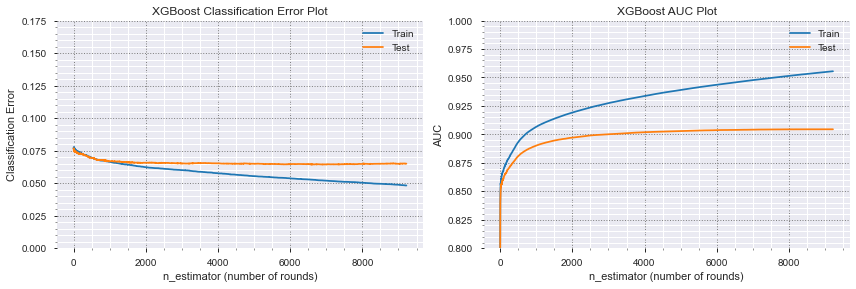

In [31]:
# Plot of Model 3-2 using early_stopping_rounds
model_performance(model, plt_error_auc=True, plt_tree=False, plt_fi=False)

Here we use the final model to make predictions by using generating each patient's hospital_death probability. The result is saved to a csv file and uploaded to Kaggle for prediction score.

In [34]:
## prediction of unlabeled data by using three generated models

## retreive saved model1
modelFile = "xgb_default.pickle"
model = pickle.load(open(modelFile, "rb"))
submitFile = 'submit_xgb_1.csv'

# predict
y_pred_unlabeled = model.predict_proba(X_test)[:,1]

data_to_submit = pd.DataFrame({
    'encounter_id':X_test.index,
    'hospital_death':y_pred_unlabeled
})

# save prediction to csv file
data_to_submit.to_csv(submitFile, index = False)


## retreive saved model2
modelFile = "xgb_2.pickle"
model = pickle.load(open(modelFile, "rb"))
submitFile = 'submit_xgb_2.csv'

# predict
y_pred_unlabeled = model.predict_proba(X_test)[:,1]

data_to_submit = pd.DataFrame({
    'encounter_id':X_test.index,
    'hospital_death':y_pred_unlabeled
})

# save prediction to csv file
data_to_submit.to_csv(submitFile, index = False)


# retreive saved model3_2
modelFile = "xgb_3_2.pickle"
model = pickle.load(open(modelFile, "rb"))
submitFile = 'submit_xgb_3_2.csv'


# predict
y_pred_unlabeled = model.predict_proba(X_test)[:,1]

data_to_submit = pd.DataFrame({
    'encounter_id':X_test.index,
    'hospital_death':y_pred_unlabeled
})

# save prediction to csv file
data_to_submit.to_csv(submitFile, index = False)

data_to_submit.head()

,encounter_id,hospital_death
0,2,0.013782
1,5,0.040231
2,7,0.013165
3,8,0.112359
4,10,0.671208


After uploading the submit files to Kaggle, the final model gets the best score on Kaggle! Woohoo!


|Submission and Description                                                      |Private Score   | Public Score   |
|:--                                                                             |:--             |:--:            |
|*submit_xgb_3.csv* <br/> **XGBoost Model 3 after Hyper-parameter Tuning**       | 0.90677        | 0.90889        |
|*submit_xgb_2.csv* <br/> **XGBoost Model 2 with Manually Adjusted Parameters**  | 0.90522        | 0.90702        |
|*submit_xgb_1.csv* <br/> **XGBoost Default Model**                              | 0.89075        | 0.89686        |

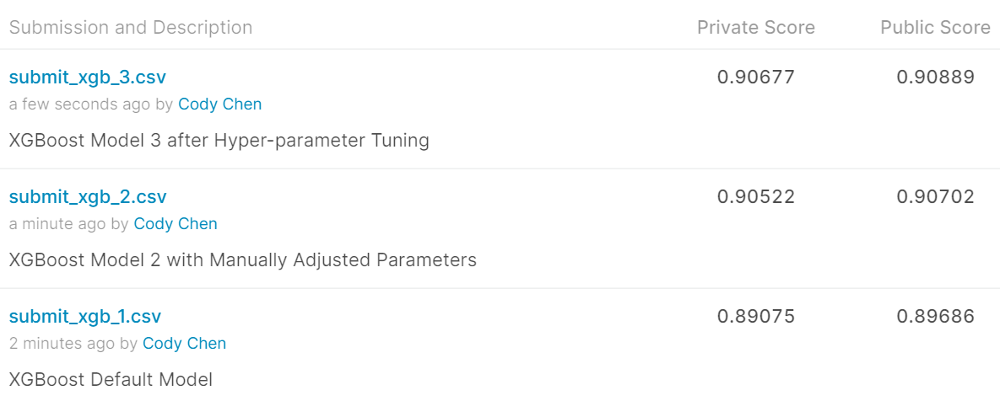

<h2> <a id="conclusion">8. Conclusion</a></h2>

[Back](#outline)

XGBoost dominates structured or tabular datasets on classification and regression predictive modeling problems.

The baseline model has a **0.8968** AUC score from Kaggle. After adjust some critical parameters: <code>n_estimators</code>, <code>subsample</code>, and <code>colsample_bytree</code>, we improve the model to **0.9070**. Tuning Model 2 with hyper-parameter tuning, we discover the best performing model with AUC score of **0.9088**.

Through our model building, since XGBoost's long computing time (max.  ≈  2 days) we used another ensemble learning method, <code>LightGBM</code> that has faster executing time and grows leaf-wise instead of level-wise. However, it does not provide higher prediction scores.  

All in all, estimates of morality rate is useful in triage and resource allocation in determining appriate care levels and communicating with patients expected outcomes. We are excited to gain medical knowledge and potentially share useful solutions to clinical practices. 